In [ ]:
import numpy as np

# 🐶 End-to-end Multi-Class Dog-Breed-Classification

# Getting our workspace ready.

In [ ]:
# Importing TensorFlow into collab.
# Import Tensorflow HUB.
# Make sure we're using a GPU.

import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF HUB version: ", hub.__version__)
print("GPU", "available (YES!!!!!)" if tf.config.list_physical_devices("GPU") else "not availale")

TF version:  2.12.0
TF HUB version:  0.14.0
GPU available (YES!!!!!)


# GETTING OUR DATA READY

In [ ]:
# Checking out the labels
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/DogVision/labels.csv");
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

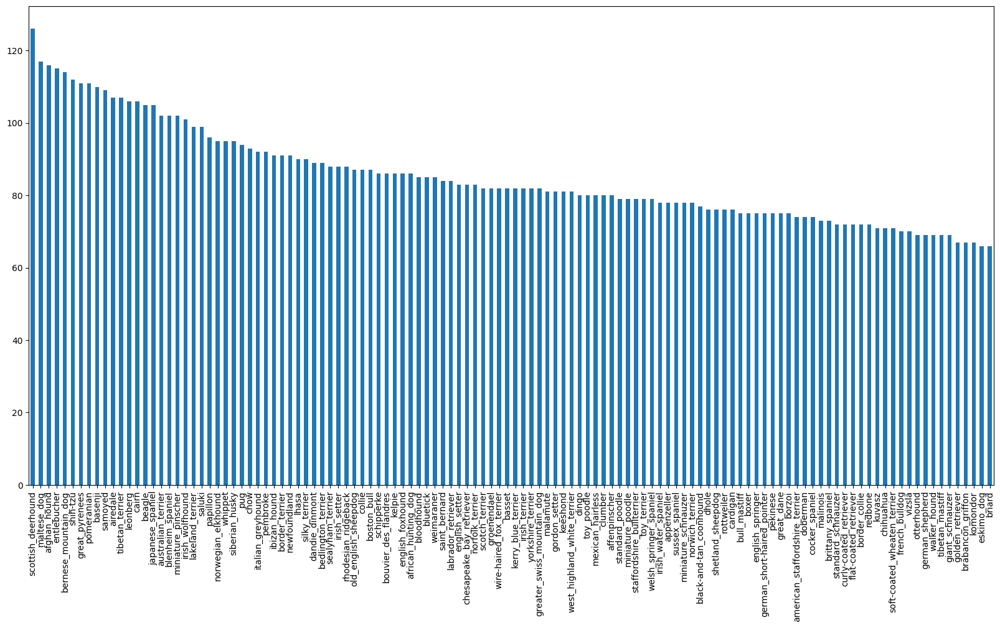

In [ ]:
# How many images are of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

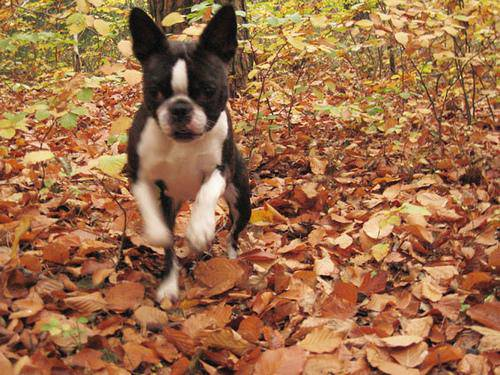

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting the labels of the images.

#### Lets get the image file path names.

In [ ]:
# Creating the pathnames for the images.
filenames = ["/content/drive/MyDrive/DogVision/train/" + fname for fname in labels_csv["id"] + ".jpg"]
filenames

['/content/drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/DogVision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/DogVision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/DogVision/train

In [ ]:
# Checking if we have all the file names.
import os
if len(os.listdir("/content/drive/MyDrive/DogVision/train/")) == len(filenames):
  print("YES")
else:
  print("NO")

YES


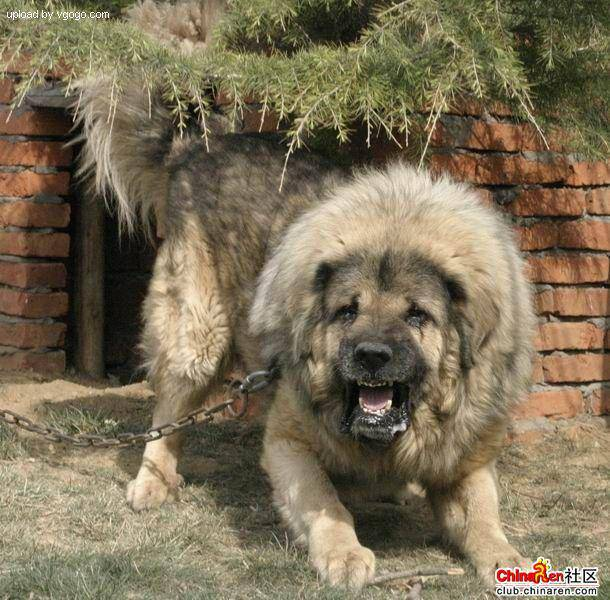

In [ ]:
Image(filenames[9000])

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Finding the unique label values
unique_breeds = np.unique(labels)
# The total number dog breeds.
len(unique_breeds)


120

In [ ]:
# Turn a single label into array of boolean
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[2])
print(np.where(unique_breeds == labels[2])) # index where label occurs
print(boolean_labels[2].astype(int))

pekinese
(array([85]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# CREATING OUR OWN VALIDATION SET

In [ ]:
# Setup x & y
X = filenames
Y = boolean_labels

In [ ]:
len(Y)

10222

## Experimenting with ~1000 samples and increase as needed.

In [ ]:
# Setting the number of images to use for the experimentation.
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets.
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES], Y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(X_val), len(Y_train), len(Y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:5], Y_train[:5]

(['/content/drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, Fa

# Preprocessing the images (turning images into tensors)
## To preprocess the images into tensors we will write a function which does the following things:
1. Take an image filepath as input.
2. Use tensorflow to read the image and save it in a variable, `image`.
3. Turn the `image` (.jpg) into tensors.
4. Resize the `image` into (224, 224).
5. Return the modified `image`.

In [ ]:
# Comverting the image to numpy array.
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define the image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  # Read the image
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensors with 3 channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color values to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning or data into batches.

Batch Size => 32.

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple.
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Defining the batch size

BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, Y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  # If the data is the test dataset, we probabaly don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only file paths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we donot want to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches....")
    # turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create traing and validation data batches
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)


Creating training data batches....
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
Y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

# VISUALING THE DATA BATCHES

In [ ]:
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  # loop through 25 (for displaying 25 images)
  for i in range(25):
    # create the subplots (5, 5)
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

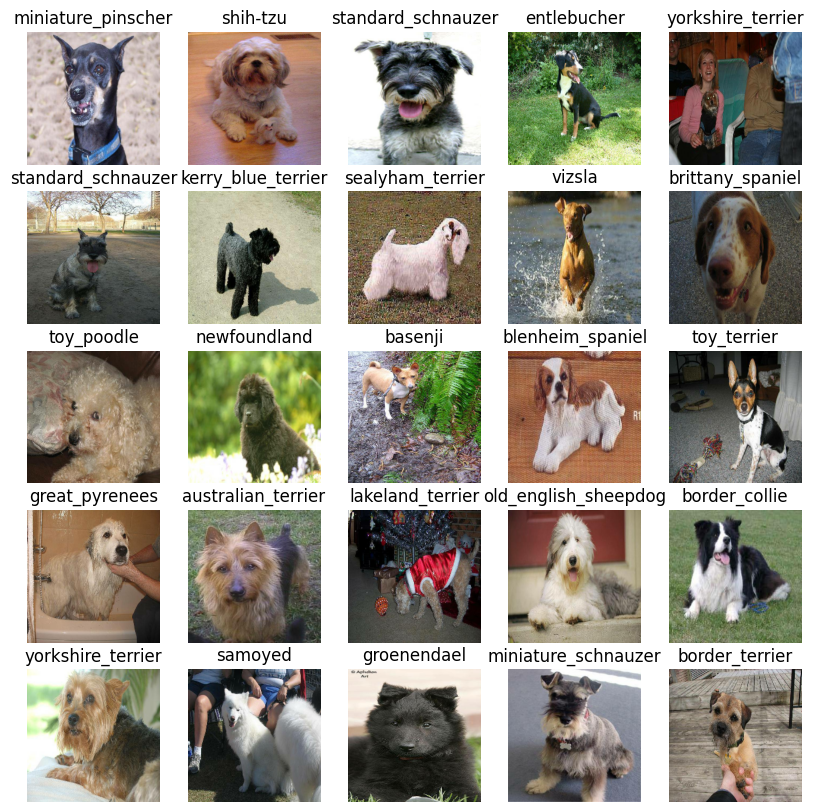

In [ ]:
# Now let's visualise the data in the training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# BUILDING OUR MODEL

* The input shape of our model.
* the output shape of our model.
* The URL of the model we want to use.

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model.
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape to the model.
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now that we have our input, output and model ready to go. Let's put it into a keras model.

In [ ]:
# Create a function which builds a Keras model.
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("BUILDING THE MODEL WITH: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

BUILDING THE MODEL WITH:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# CREATING THE CALLBACKS
### Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop if the model stops improving.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/DogVision/logs", # Make it so that logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S%"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early Stopping Callback
## We can stop the model early from overfitting when the model fails to stop improving


In [ ]:
# Creating the early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

# TRAINING A MODEL (ON SUBSET OF DATA)

### Our model is going to train on only 1000 images to make sure that everything is working fine.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure that the GPU is still runnnig.
print("GPU", "available (YES!!!!!)" if tf.config.list_physical_devices("GPU") else "not availale")

GPU available (YES!!!!!)


# Lets create a function that trains the model.

In [ ]:
def train_model():
  # Create the model
  model = create_model()
  # Creating new TensorBoard session everytime we train a model.
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data by passing it the callbacks we created.
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitting model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

BUILDING THE MODEL WITH:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 156s 4s/step - loss: 4.5011 - accuracy: 0.0988 - val_loss: 3.4436 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 4s 148ms/step - loss: 1.6175 - accuracy: 0.6862 - val_loss: 2.1728 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 5s 190ms/step - loss: 0.5611 - accuracy: 0.9400 - val_loss: 1.7016 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 147ms/step - loss: 0.2532 - accuracy: 0.9825 - val_loss: 1.5307 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 3s 138ms/step - loss: 0.1449 - accuracy: 0.9950 - val_loss: 1.4487 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.0995 - accuracy: 0.9987 - val_loss: 1.4059 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==========================

### What can we do to prevent the model from overfitting?
# Checking the TensorBoard logs

## The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/DogVision/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using the trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make the predictions on the validation data (not used to train)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 98ms/step


array([[1.0681092e-03, 3.1722553e-05, 9.8752114e-04, ..., 1.2721044e-04,
        2.1758868e-05, 2.6943618e-03],
       [1.2500535e-03, 7.9464218e-05, 9.7574554e-03, ..., 9.1264359e-05,
        1.5932595e-04, 2.3796176e-05],
       [2.5277416e-06, 2.0027210e-04, 1.2253893e-06, ..., 8.6938498e-06,
        3.1714007e-05, 6.6911581e-04],
       ...,
       [4.6676869e-06, 2.2792021e-05, 1.0672293e-05, ..., 5.9708827e-06,
        5.9679536e-05, 1.5469916e-05],
       [1.9509838e-03, 6.7135363e-05, 1.1310260e-04, ..., 1.3068470e-04,
        6.0005877e-05, 1.5361527e-02],
       [5.7119052e-03, 1.2889027e-04, 3.4141303e-03, ..., 5.5917241e-03,
        6.1650464e-04, 5.7802274e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.91594096e-04 4.26453662e-05 1.93981523e-05 3.85011626e-05
 9.77492775e-04 1.49447824e-05 3.92611866e-04 4.57747752e-04
 1.40612600e-02 1.19969957e-02 1.87507667e-05 5.03982756e-06
 4.62646713e-04 2.71715014e-03 2.66385876e-04 1.09977659e-03
 2.30804053e-05 2.50314537e-04 9.81398625e-05 7.58893962e-04
 4.39511750e-05 1.24289317e-03 9.64568608e-05 2.47158914e-05
 8.47951882e-03 2.65013623e-05 1.42551626e-05 2.18396308e-05
 2.24133673e-05 4.76635796e-05 1.12362424e-04 5.50637124e-05
 4.96932371e-05 2.09084392e-05 1.16933907e-05 1.01851059e-04
 5.13192463e-05 5.34226885e-04 5.78864019e-05 2.96212643e-01
 7.82639981e-05 2.07896173e-05 2.85001728e-03 9.35744265e-06
 9.75767325e-05 1.77689944e-05 8.65934198e-05 8.32450052e-04
 3.98753127e-06 2.69940880e-04 1.38503901e-05 6.98922158e-05
 3.47716297e-04 9.21354629e-04 3.36815879e-06 4.67544567e-04
 8.20140122e-05 8.60351574e-05 9.72281268e-05 1.53045876e-05
 1.98370599e-05 9.55322932e-04 6.93687116e-06 3.72500108e-05
 1.94855747e-05 9.830172

In [ ]:
# Turning the prediction probabilities to their respective labels
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# Creating the unbatchify function
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

# We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image & remove ticks
  if (pred_label == true_label):
    color = "purple"
  else:
    color = "red"
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  plt.title("{} {:2.0f}% {}". format(pred_label, np.max(pred_prob) * 100, true_label), color = color)

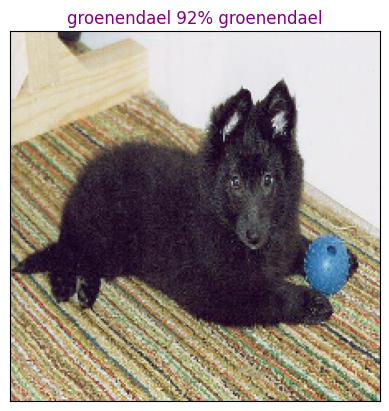

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n = 77)

# Plot the top 10 highest predictions confidences along with the truth label for sample n.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence indexes
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction confidence labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

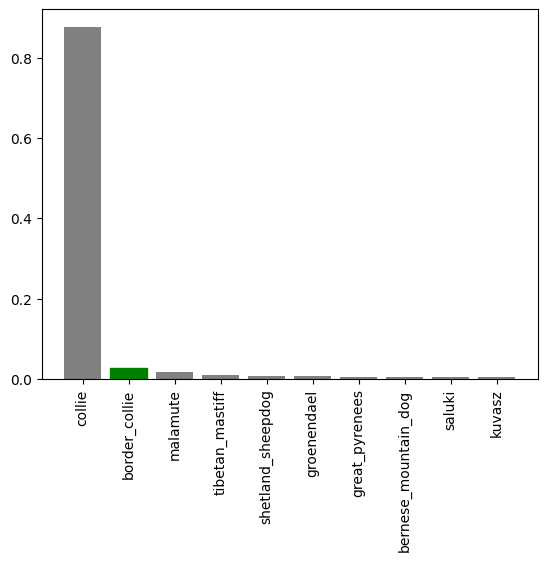

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n = 9)

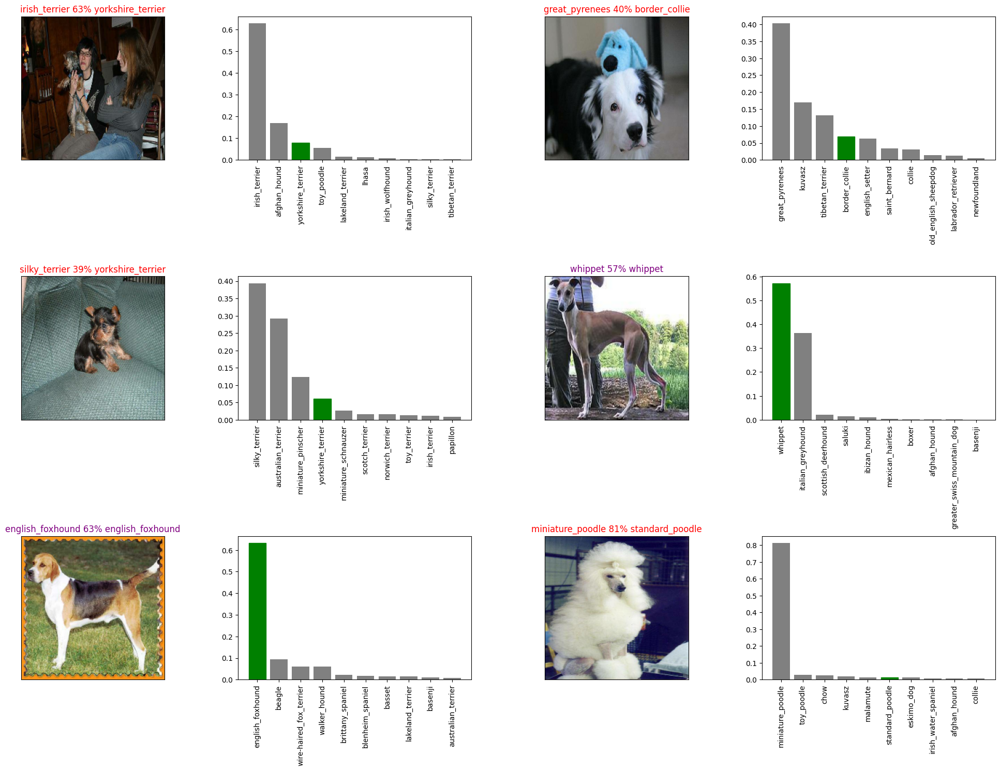

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# SAVING AND LOADING A TRAINED MODEL

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/DogVision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save the format of the model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Saving the model that is trained on 1000 images.
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/DogVision/models/20230805-09141691226863-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/DogVision/models/20230805-09141691226863-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Loading the model trained on 1000 images
loaded_1000_images_model = load_model("/content/drive/MyDrive/DogVision/models/20230805-07071691219256-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/DogVision/models/20230805-07071691219256-1000-images-mobilenetv2-Adam.h5


# Training a big dog model (on the full data)

In [ ]:
len(X), len(Y)
Y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Creating a data batch with a full dataset
full_data = create_data_batches(X, Y)

Creating training data batches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

BUILDING THE MODEL WITH:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create a full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cannot monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 44s 122ms/step - loss: 1.3403 - accuracy: 0.6723
Epoch 2/100
320/320 [==============================] - 36s 112ms/step - loss: 0.4006 - accuracy: 0.8821
Epoch 3/100
320/320 [==============================] - 39s 123ms/step - loss: 0.2359 - accuracy: 0.9337
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1536 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 35s 110ms/step - loss: 0.1046 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0776 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 38s 117ms/step - loss: 0.0588 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0451 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 35s 111ms/step - loss: 0.0361 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 34s 107m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/DogVision/models/20230805-09441691228699-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/DogVision/models/20230805-09441691228699-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/DogVision/models/20230805-09441691228699-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/DogVision/models/20230805-09441691228699-full-image-set-mobilenetv2-Adam.h5


# MAKING PREDICTIONS ON THE TEST DATASET

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/DogVision/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 '/content/drive/MyDrive/DogVision/test/e23ad195d88975333bbcde7dce5faf01.jpg',
 '/content/drive/MyDrive/DogVision/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 '/content/drive/MyDrive/DogVision/test/e5f207e00213cc76be3ae9219a2e49cb.jpg',
 '/content/drive/MyDrive/DogVision/test/e1d31decdd6521df89e59d181f0c73ed.jpg',
 '/content/drive/MyDrive/DogVision/test/e218c0da622fedc975a97999ad7d48a5.jpg',
 '/content/drive/MyDrive/DogVision/test/e01b6b1e7cef1d9abdfbeb4afb88379f.jpg',
 '/content/drive/MyDrive/DogVision/test/e48e4d9137c69e69f54f85907c061172.jpg',
 '/content/drive/MyDrive/DogVision/test/e0f2620cb1ebf648b986c8a09dbd3664.jpg',
 '/content/drive/MyDrive/DogVision/test/dfc5d207b533d381045984a0a0adb23c.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1) # Will take ~ 1 hour

324/324 [==============================] - 220s 643ms/step
